# Install dependencies

In [1]:
!pip install -U -q "tf-models-official"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 88.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 58.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 49.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 56.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 39.4 MB/s eta 0:00:

# Import libraries

In [2]:
import os
import io
import pprint
import tempfile
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import gdown
import shutil
import json
import random
from datetime import datetime, timezone
import cv2
from PIL import Image

from PIL import Image
from six import BytesIO
from IPython import display
from urllib.request import urlopen

import orbit
import tensorflow_models as tfm

from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.serving import export_saved_model_lib
from official.vision.ops.preprocess_ops import normalize_image
from official.vision.ops.preprocess_ops import resize_and_crop_image
from official.vision.utils.object_detection import visualization_utils
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline


2.16.1


# Download dataset

In [3]:
if os.path.exists("/data"):
  shutil.rmtree("/data")

if not os.path.exists("data.zip"):
  id = "10Aaruu9UDFrJJ8Bw24cndj4YiB3F9aCl"
  output = "/content/data.zip"
  gdown.download(id=id, output=output)

!unzip -q /content/data.zip -d /content/

Downloading...
From (original): https://drive.google.com/uc?id=10Aaruu9UDFrJJ8Bw24cndj4YiB3F9aCl
From (redirected): https://drive.google.com/uc?id=10Aaruu9UDFrJJ8Bw24cndj4YiB3F9aCl&confirm=t&uuid=daf1da7b-9451-4ea5-8b20-e345168ea51e
To: /content/data.zip
100%|██████████| 404M/404M [00:05<00:00, 73.7MB/s]


# Global Variables

In [4]:
UNSPLIT_DATASET_DIR = "data"

OFFICIAL_IMG = "official/images"
OFFICIAL_LABEL = "official/labels"
UNOFFICIAL_IMG = "unofficial/images"
UNOFFICIAL_LABEL = "unofficial/labels"

UNSPLIT_IMG_PATH_DICT = {"official": OFFICIAL_IMG, "unofficial": UNOFFICIAL_IMG}
UNSPLIT_LABEL_PATH_DICT = {"official": OFFICIAL_LABEL, "unofficial": UNOFFICIAL_LABEL}

DATASET_DIR = "TACO"

TRAIN_IMG = "train/images"
TRAIN_LABEL = "train/labels"

VAL_IMG = "valid/images"
VAL_LABEL = "valid/labels"

TEST_IMG = "test/images"
TEST_LABEL = "test/labels"

TRAIN_SPLIT = 0.85
VAL_SPLIT = 0.1
TEST_SPLIT = 0.05

IMG_PATH_DICT = {"train": TRAIN_IMG, "val": VAL_IMG, "test": TEST_IMG}
LABEL_PATH_DICT = {"train": TRAIN_LABEL, "val": VAL_LABEL, "test": TEST_LABEL}

USE_SUPERCATEGORY = True

IMG_SIZE_W = 480
IMG_SIZE_H = 480

BATCH_SIZE = 8

In [5]:
official_json = "official.json"

if not os.path.exists("official.json"):
  id = "1TzxsRbWdp3y8Mr6oiRQqynDo_MqkOaQi"
  output = "official.json"
  gdown.download(id=id, output=output)

with open(official_json ,"r") as f:
  data = json.loads(f.read())
  nr_categories = len(data['categories'])

  OLD_CLASS_LABELS = {}
  CLASS_LABELS = {}

  for i in range(nr_categories):
    category = data['categories'][i]
    if USE_SUPERCATEGORY:
      category_name = category['supercategory']
    else:
      category_name = category['name']
    category_id = category['id']
    OLD_CLASS_LABELS[category_id] = category_name
    if category_name not in CLASS_LABELS.values():
      CLASS_LABELS[len(CLASS_LABELS)] = category_name

print(OLD_CLASS_LABELS)
print(len(OLD_CLASS_LABELS))
print(CLASS_LABELS)
print(len(CLASS_LABELS))

Downloading...
From: https://drive.google.com/uc?id=1TzxsRbWdp3y8Mr6oiRQqynDo_MqkOaQi
To: /content/official.json
100%|██████████| 3.02M/3.02M [00:00<00:00, 87.6MB/s]


{0: 'Aluminium foil', 1: 'Battery', 2: 'Blister pack', 3: 'Blister pack', 4: 'Bottle', 5: 'Bottle', 6: 'Bottle', 7: 'Bottle cap', 8: 'Bottle cap', 9: 'Broken glass', 10: 'Can', 11: 'Can', 12: 'Can', 13: 'Carton', 14: 'Carton', 15: 'Carton', 16: 'Carton', 17: 'Carton', 18: 'Carton', 19: 'Carton', 20: 'Cup', 21: 'Cup', 22: 'Cup', 23: 'Cup', 24: 'Cup', 25: 'Food waste', 26: 'Glass jar', 27: 'Lid', 28: 'Lid', 29: 'Other plastic', 30: 'Paper', 31: 'Paper', 32: 'Paper', 33: 'Paper', 34: 'Paper bag', 35: 'Paper bag', 36: 'Plastic bag & wrapper', 37: 'Plastic bag & wrapper', 38: 'Plastic bag & wrapper', 39: 'Plastic bag & wrapper', 40: 'Plastic bag & wrapper', 41: 'Plastic bag & wrapper', 42: 'Plastic bag & wrapper', 43: 'Plastic container', 44: 'Plastic container', 45: 'Plastic container', 46: 'Plastic container', 47: 'Plastic container', 48: 'Plastic glooves', 49: 'Plastic utensils', 50: 'Pop tab', 51: 'Rope & strings', 52: 'Scrap metal', 53: 'Shoe', 54: 'Squeezable tube', 55: 'Straw', 56: '

# Relabel all annotations (use this if using super categories)

In [6]:
if USE_SUPERCATEGORY:
    if os.path.exists(os.path.join(UNSPLIT_DATASET_DIR, "official/new-labels")):
        shutil.rmtree(os.path.join(UNSPLIT_DATASET_DIR, "official/new-labels"))
    os.makedirs(os.path.join(UNSPLIT_DATASET_DIR, "official/new-labels"))

    if os.path.exists(os.path.join(UNSPLIT_DATASET_DIR, "unofficial/new-labels")):
        shutil.rmtree(os.path.join(UNSPLIT_DATASET_DIR, "unofficial/new-labels"))
    os.makedirs(os.path.join(UNSPLIT_DATASET_DIR, "unofficial/new-labels"))

    for file_name in os.listdir(os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_LABEL)):
        file_path = os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_LABEL, file_name)

        annotations = []
        new_annotations = []

        with open(file_path, "r") as f:
            for line in f:
                annotations.append(line)

        for i in range(len(annotations)):
            try:
                annot = annotations[i]
                class_id, bbox_x, bbox_y, bbox_h, bbox_w = annot.split(' ')
                class_name = OLD_CLASS_LABELS[int(class_id)]
                for key, value in CLASS_LABELS.items():
                    if value == class_name:
                        new_class_id = key
                        break
                new_annotations.append([new_class_id, bbox_x, bbox_y, bbox_h, bbox_w])
            except:
                continue

        new_label_path = os.path.join(UNSPLIT_DATASET_DIR, "official/new-labels", file_name)
        with open(new_label_path, "w") as f:
            for i in range(len(new_annotations)):
                line = " ".join(map(str, new_annotations[i]))
                f.write(line)

    for file_name in os.listdir(os.path.join(UNSPLIT_DATASET_DIR, UNOFFICIAL_LABEL)):
        file_path = os.path.join(UNSPLIT_DATASET_DIR, UNOFFICIAL_LABEL, file_name)

        annotations = []
        new_annotations = []

        with open(file_path, "r") as f:
            for line in f:
                annotations.append(line)

        for i in range(len(annotations)):
            try:
                annot = annotations[i]
                class_id, bbox_x, bbox_y, bbox_h, bbox_w = annot.split(' ')
                class_name = OLD_CLASS_LABELS[int(class_id)]
                for key, value in CLASS_LABELS.items():
                    if value == class_name:
                        new_class_id = key
                        break
                new_annotations.append([new_class_id, bbox_x, bbox_y, bbox_h, bbox_w])
            except:
                continue

        new_label_path = os.path.join(UNSPLIT_DATASET_DIR, "unofficial/new-labels", file_name)
        with open(new_label_path, "w") as f:
            for i in range(len(new_annotations)):
                line = " ".join(map(str, new_annotations[i]))
                f.write(line)

    OFFICIAL_LABEL = "official/new-labels"
    UNOFFICIAL_LABEL = "unofficial/new-labels"

UNSPLIT_IMG_PATH_DICT = {"official": OFFICIAL_IMG, "unofficial": UNOFFICIAL_IMG}
UNSPLIT_LABEL_PATH_DICT = {"official": OFFICIAL_LABEL, "unofficial": UNOFFICIAL_LABEL}

# Utility functions

In [7]:
def read_label(line):
    class_id, box_x, box_y, box_w, box_h = line.strip().split()
    return int(class_id), float(box_x), float(box_y), float(box_w), float(box_h)

In [8]:
def get_file_count_per_data_type(dataset_type):
  label_dir = os.path.join(DATASET_DIR, LABEL_PATH_DICT[dataset_type])
  label_files = [f for f in os.listdir(label_dir)]

  img_dir = os.path.join(DATASET_DIR, IMG_PATH_DICT[dataset_type])
  img_files = [f for f in os.listdir(img_dir)]

  print(f"There are {len(label_files)} files in {dataset_type} set")
  if (len(label_files) != len(img_files)):
    print(f"Warning: There are {len(label_files)} labels but also {len(img_files)} images in {dataset_type} set")

In [9]:
def get_datacount_per_class(dataset_type, class_list):
  label_dir = os.path.join(DATASET_DIR, LABEL_PATH_DICT[dataset_type])
  label_files = [f for f in os.listdir(label_dir)]
  class_counts = [0] * len(class_list)

  for file_name in label_files:
    file_path = os.path.join(label_dir, file_name)
    with open(file_path, "r") as f:
      for line in f:
        class_id, _, _, _, _ = read_label(line)
        class_counts[class_id] += 1

  class_names = []
  for _, value in class_list.items():
    class_names.append(value)

  sorted_counts_names = sorted(zip(class_counts, class_names), reverse=True)
  sorted_counts, sorted_names = zip(*sorted_counts_names)

  return sorted_counts, sorted_names

In [10]:
def plot_datacount_per_class(class_list):
    plt.figure(figsize=(21, 21))

    plt.subplot(3, 1, 1)
    count, names = get_datacount_per_class("train", class_list)
    plt.title("Train")
    plt.barh(names, count)

    plt.subplot(3, 1, 2)
    count, names = get_datacount_per_class("val", class_list)
    plt.title("Validation")
    plt.barh(names, count)

    plt.subplot(3, 1, 3)
    count, names = get_datacount_per_class("test", class_list)
    plt.title("Test")
    plt.barh(names, count)

    plt.show()

In [11]:
def display_images(image_list, num_images, plot_title, dataset_type):
  label_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_LABEL_PATH_DICT[dataset_type])
  img_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_IMG_PATH_DICT[dataset_type])
  plt.figure(figsize=(12, 12))
  for i, label_name in enumerate(image_list):
    image_name = label_name.replace(".txt", ".jpg")
    img_path = os.path.join(img_dir, image_name)
    label_path = os.path.join(label_dir, label_name)

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    ax = plt.subplot(num_images, num_images, i + 1)
    plt.imshow(img)
    plt.axis("off")

    with open(label_path, "r") as f:
      for line in f:
        _, x1, y1, box_width, box_height = read_label(line)

        rect = patches.Rectangle(
            (x1, y1),
            box_width,
            box_height,
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
        ax.add_patch(rect)
      if (i+1 == len(image_list)):
        break
  plt.tight_layout()
  plt.suptitle(
      plot_title,
      fontsize=30,
      y=1.05,
      fontweight="bold",
  )
  plt.show()

In [12]:
def display_images_of_certain_class(class_name, dataset_type, num_images, class_list):
  if class_name not in class_list.values():
    raise ValueError("Class name not found in the class list.")

  label_dir = os.path.join(DATASET_DIR, LABEL_PATH_DICT[dataset_type])
  label_files = [f for f in os.listdir(label_dir)]
  for key, value in class_list.items():
    if value == class_name:
      index = key
      break
  image_list = []

  for file_name in label_files:
    file_path = os.path.join(label_dir, file_name)
    with open(file_path, "r") as f:
      for line in f:
        class_id, _, _, _, _ = read_label(line)
        class_id = int(class_id)
        if class_id == index:
          image_list.append(file_name)
          break
  if len(image_list) > num_images * num_images:
    selected_images = random.sample(image_list, num_images * num_images)
  else:
    selected_images = image_list
  plot_title = f"Displaying images containing class: {class_name}"
  display_images(selected_images, num_images, plot_title, dataset_type)

In [13]:
def get_box_count_per_image(dataset_type, box_count_treshold=30):
  label_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_LABEL_PATH_DICT[dataset_type])
  label_files = [f for f in os.listdir(label_dir)]

  average_box_count = 0
  max_box_count = 0
  high_box_count_images = []

  for file_name in label_files:
    file_path = os.path.join(label_dir, file_name)
    with open(file_path, "r") as f:
      boxes = f.readlines()
      average_box_count += len(boxes)
      max_box_count = max(max_box_count, len(boxes))
      if (len(boxes)) > box_count_treshold:
        high_box_count_images.append(file_name)

  average_box_count /= len(label_files)

  return average_box_count, max_box_count, high_box_count_images

In [14]:
def get_box_size_per_image(dataset_type, box_size_treshold=0.00015):
  label_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_LABEL_PATH_DICT[dataset_type])
  label_files = [f for f in os.listdir(label_dir)]

  avg_box_size = 0
  small_box_size_images = []

  for file_name in label_files:
    file_path = os.path.join(label_dir, file_name)
    #print(file_path)
    with open(file_path, "r") as f:
      for line in f:
        #print(line)
        _, _, _, width, height = read_label(line)
        box_size = (width * height) / (IMG_SIZE_W * IMG_SIZE_H)
        avg_box_size += box_size
        #print(width, height, avg_box_size, box_size)
        if box_size < box_size_treshold:
          small_box_size_images.append(file_name)

  avg_box_size /= len(label_files)
  return avg_box_size, small_box_size_images

In [15]:
def get_filtered_boxes_overlap(boxes, iou_treshold=0.35):
  if (len(boxes) == 1):
    return boxes

  removed_boxes = []

  for i in range(len(boxes)-1):
    for j in range(i+1, len(boxes)):
      class1, x1, y1, w1, h1 = read_label(boxes[i])
      class2, x2, y2, w2, h2 = read_label(boxes[j])

      if class1 != class2:
        continue

      x_overlap = max(0, min(x1 + w1 / 2, x2 + w2 / 2) - max(x1 - w1 / 2, x2 - w2 / 2))
      y_overlap = max(0, min(y1 + h1 / 2, y2 + h2 / 2) - max(y1 - h1 / 2, y2 - h2 / 2))

      intersect = x_overlap * y_overlap
      union = w1 * h1 + w2 * h2 - intersect
      IoU = intersect / union

      if IoU > iou_treshold:
        if w1*h1 < w2*h2:
          removed_boxes.append(i)
        else:
          removed_boxes.append(j)

  filtered_boxes = [box for i, box in enumerate(boxes) if i not in removed_boxes]

  return filtered_boxes

In [16]:
def get_number_of_overlapping_boxes(dataset_type, iou_treshold=0.35):
  label_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_LABEL_PATH_DICT[dataset_type])
  label_files = [f for f in os.listdir(label_dir)]

  total_box_count = 0
  total_high_overlap_box_count = 0
  high_box_overlap_images = []

  for file_name in label_files:
    file_path = os.path.join(label_dir, file_name)

    boxes = []
    with open(file_path, "r") as f:
      for line in f:
        boxes.append(line)

    filtered_boxes = get_filtered_boxes_overlap(boxes, iou_treshold)

    total_box_count += len(boxes)
    total_high_overlap_box_count += len(boxes) - len(filtered_boxes)
    if (len(boxes) != len(filtered_boxes)):
      high_box_overlap_images.append(file_name)
  return total_box_count, total_high_overlap_box_count, high_box_overlap_images

In [17]:
def get_time():
    now = datetime.now(timezone.utc)
    iso_format = now.strftime("%Y-%m-%dT:%H:%M:%S%z")
    iso_format = iso_format[:22] + ':' + iso_format[22:]
    return iso_format

In [18]:
def img_annot_section(dataset_type):
  images_section = []
  annotations_section = []

  img_dir = os.path.join(DATASET_DIR, IMG_PATH_DICT[dataset_type])
  annot_count = 0

  for i, img in enumerate(os.listdir(img_dir)):
    img_dict = dict()
    img_dict['id'] = i
    img_dict['license'] = 1
    img_dict['file_name'] = img
    img_dict['height'] = IMG_SIZE_H
    img_dict['width'] = IMG_SIZE_W
    img_dict['date_captured'] = get_time()
    images_section.append(img_dict)

    label = img.replace(".jpg", ".txt")
    label_file = os.path.join(DATASET_DIR, LABEL_PATH_DICT[dataset_type], label)
    with open(label_file, "r") as f:
        for line in f:
            class_id, bbox_x, bbox_y, bbox_w, bbox_h = line.split()
            annot_dict = dict()
            annot_dict['id'] = annot_count
            annot_dict['image_id'] = i
            annot_dict['category_id'] = int(class_id) + 1
            annot_dict['bbox'] = [float(bbox_x), float(bbox_y), float(bbox_w), float(bbox_h)]
            annot_dict['area'] = float(bbox_w) * float(bbox_h)
            annot_dict['segmentation'] = []
            annot_dict['iscrowd'] = 0
            annot_count += 1
            annotations_section.append(annot_dict)
  return images_section, annotations_section

In [19]:
def get_final_json(info_section, licences_section, categories_section, images_section, annotations_section):
  final_json = dict()
  final_json['info'] = info_section
  final_json['licenses'] = licences_section
  final_json['categories'] = categories_section
  final_json['images'] = images_section
  final_json['annotations'] = annotations_section
  return final_json

In [20]:
def show_batch(raw_records, num_of_examples):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        max_boxes_to_draw=200,
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=4)

    plt.imshow(image)
    plt.axis('off')
    plt.title(f'Image-{i+1}')
  plt.show()


In [21]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)

In [22]:
def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image

# Preprocessing

## Invalid box boundaries (infinite)

In [23]:
def invalid_box_boundary(dataset_type):
    dir_path = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_LABEL_PATH_DICT[dataset_type])
    invalid_boxes = 0
    for file_name in os.listdir(dir_path):
        file_path = os.path.join(dir_path, file_name)

        new_annotations = []

        with open(file_path, "r") as f:
            for line in f:
                class_id, bbox_x, bbox_y, bbox_h, bbox_w = line.split(' ')
                if (bbox_x == "inf" or bbox_x == "-inf" or bbox_y == "inf" or bbox_y == "-inf" or bbox_h == "inf" or bbox_h == "-inf" or bbox_w == "inf" or bbox_w == "-inf"):
                    invalid_boxes += 1
                    continue
                new_annotations.append([class_id, bbox_x, bbox_y, bbox_h, bbox_w])

        with open(file_path, "w") as f:
            for i in range(len(new_annotations)):
                line = " ".join(map(str, new_annotations[i]))
                f.write(line)
    print(f"Found and removed {invalid_boxes} invalid boxes in {dataset_type} set")

In [24]:
invalid_box_boundary("official")
invalid_box_boundary("unofficial")

Found and removed 0 invalid boxes in official set
Found and removed 15 invalid boxes in unofficial set


## Too many boxes in 1 image

In [25]:
def images_with_high_box_count(dataset_type, num_images, box_count_treshold=30):
  _, _, high_box_count_images = get_box_count_per_image(dataset_type, box_count_treshold = box_count_treshold)

  if len(high_box_count_images) > num_images * num_images:
    selected_images = random.sample(high_box_count_images, num_images * num_images)
  else:
    selected_images = high_box_count_images

  plot_title = f"Images with at least {box_count_treshold} boxes in {dataset_type} set"
  display_images(selected_images, num_images, plot_title, dataset_type)

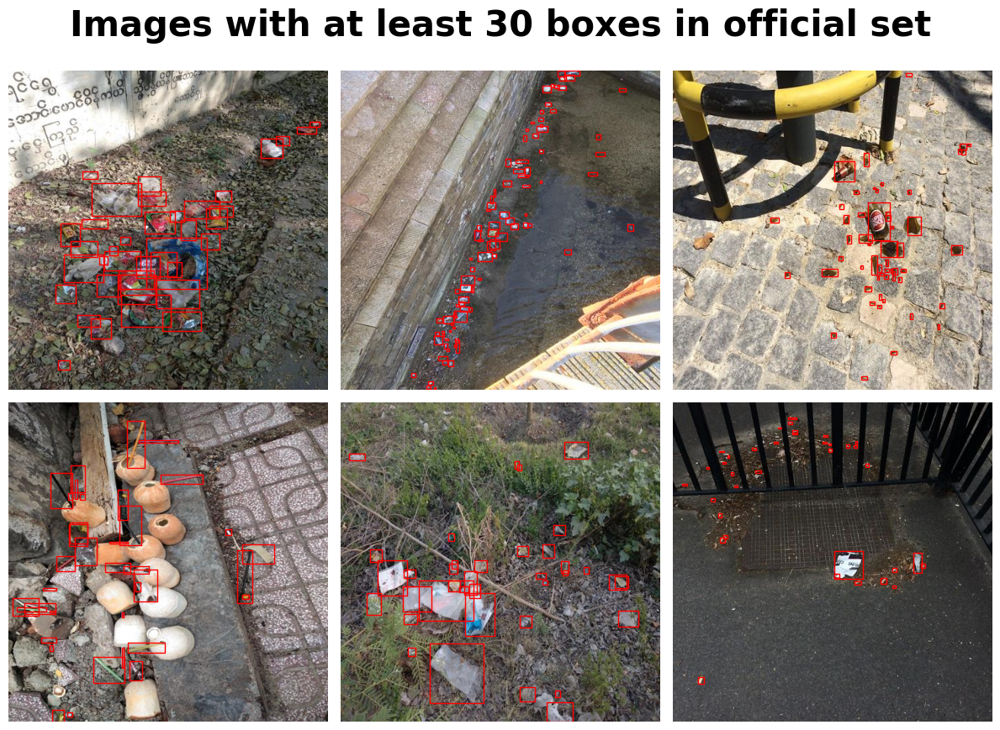

In [26]:
images_with_high_box_count("official", 3)

In [27]:
def discard_images_with_high_box_count(dataset_type, box_count_treshold=30):
  _, _, high_box_count_images = get_box_count_per_image(dataset_type, box_count_treshold = box_count_treshold)

  label_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_LABEL_PATH_DICT[dataset_type])
  img_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_IMG_PATH_DICT[dataset_type])
  count = 0

  for label_name in high_box_count_images:
    img_name = label_name.replace(".txt", ".jpg")

    img_path = os.path.join(img_dir, img_name)
    label_path = os.path.join(label_dir, label_name)

    if os.path.exists(img_path):
      os.remove(img_path)
    if os.path.exists(label_path):
      os.remove(label_path)

    count += 1
  print(f"Removed {count} images from {dataset_type} set")

In [28]:
discard_images_with_high_box_count("official")
discard_images_with_high_box_count("unofficial")

Removed 6 images from official set
Removed 11 images from unofficial set


## Box size too small

In [29]:
def images_with_small_boxes(dataset_type, num_images, box_size_treshold=0.00015):
  _, small_box_size_images = get_box_size_per_image(dataset_type, box_size_treshold = box_size_treshold)

  if len(small_box_size_images) > num_images * num_images:
    selected_images = random.sample(small_box_size_images, num_images * num_images)
  else:
    selected_images = small_box_size_images

  plot_title = f"Images with box sizes below {box_size_treshold} boxes in {dataset_type} set"
  display_images(selected_images, num_images, plot_title, dataset_type)

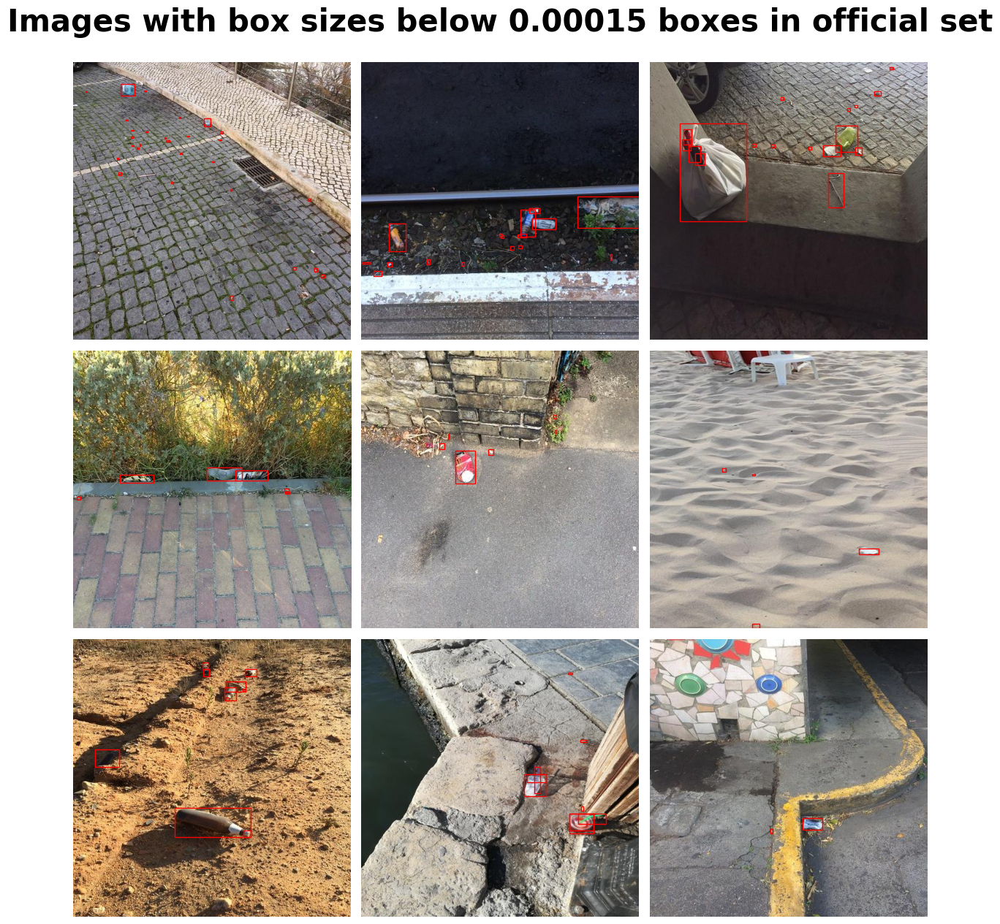

In [30]:
images_with_small_boxes("official", 3)

In [31]:
def discard_images_with_small_boxes(dataset_type, box_size_treshold=0.00015):
  _, small_box_size_images = get_box_size_per_image(dataset_type, box_size_treshold = box_size_treshold)

  label_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_LABEL_PATH_DICT[dataset_type])
  img_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_IMG_PATH_DICT[dataset_type])
  count = 0

  for label_name in small_box_size_images:
    img_name = label_name.replace(".txt", ".jpg")

    img_path = os.path.join(img_dir, img_name)
    label_path = os.path.join(label_dir, label_name)

    if os.path.exists(img_path):
      os.remove(img_path)
    if os.path.exists(label_path):
      os.remove(label_path)

    count += 1
  print(f"Removed {count} images from {dataset_type} set")

In [32]:
discard_images_with_small_boxes("official")
discard_images_with_small_boxes("unofficial")

Removed 385 images from official set
Removed 197 images from unofficial set


## Big overlap between boxes of same class

In [33]:
def images_with_high_box_overlap(dataset_type, num_images, iou_treshold=0.35):
  _, _, high_box_overlap_images = get_number_of_overlapping_boxes(dataset_type, iou_treshold = iou_treshold)

  if len(high_box_overlap_images) > num_images * num_images:
    selected_images = random.sample(high_box_overlap_images, num_images * num_images)
  else:
    selected_images = high_box_overlap_images

  plot_title = f"Images with box overlap above {iou_treshold} boxes in {dataset_type} set"
  display_images(selected_images, num_images, plot_title, dataset_type)

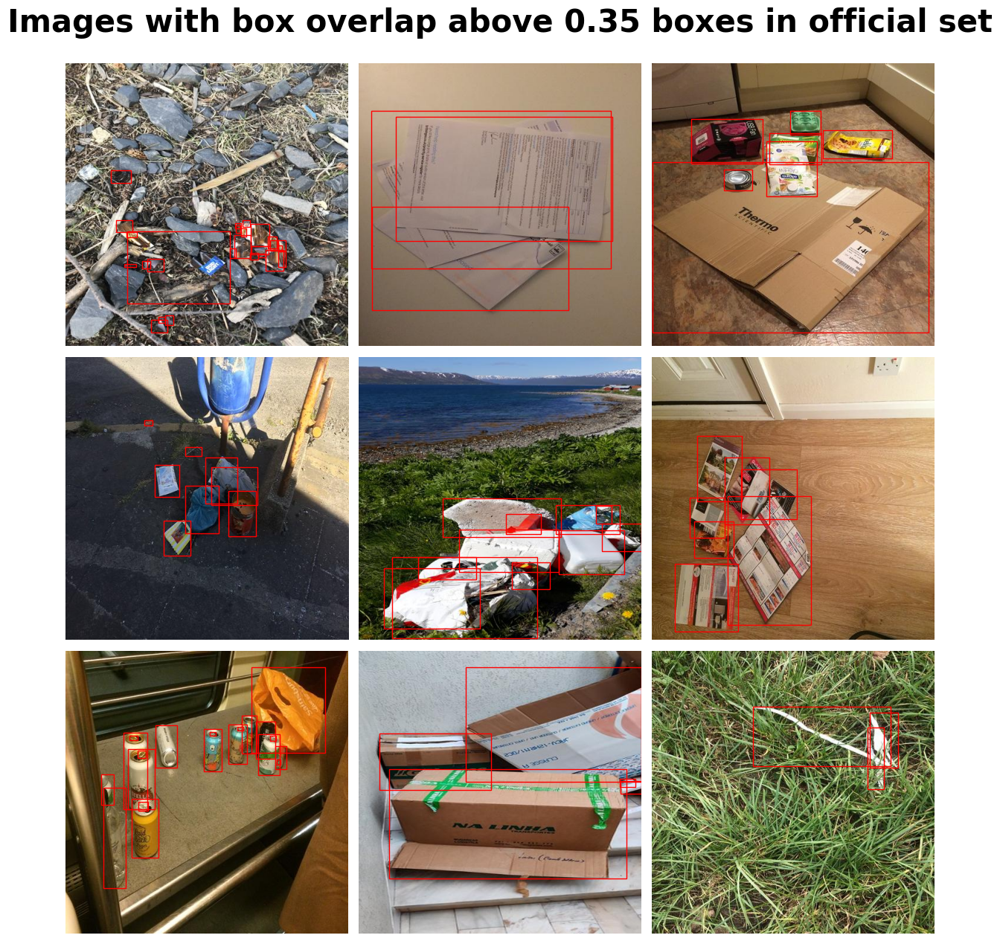

In [34]:
images_with_high_box_overlap("official", 3)

In [35]:
def discard_images_with_high_box_overlap(dataset_type, iou_treshold=0.35):
  _, _, high_box_overlap_images = get_number_of_overlapping_boxes(dataset_type, iou_treshold = iou_treshold)

  label_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_LABEL_PATH_DICT[dataset_type])
  img_dir = os.path.join(UNSPLIT_DATASET_DIR, UNSPLIT_IMG_PATH_DICT[dataset_type])
  count = 0

  for label_name in high_box_overlap_images:
    img_name = label_name.replace(".txt", ".jpg")

    img_path = os.path.join(img_dir, img_name)
    label_path = os.path.join(label_dir, label_name)

    if os.path.exists(img_path):
      os.remove(img_path)
    if os.path.exists(label_path):
      os.remove(label_path)

    count += 1
  print(f"Removed {count} images from {dataset_type} set")

In [36]:
discard_images_with_high_box_overlap("official")
discard_images_with_high_box_overlap("unofficial")

Removed 11 images from official set
Removed 10 images from unofficial set


# Split train val test

In [37]:
off_count = len(os.listdir(os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_IMG)))
unoff_count = len(os.listdir(os.path.join(UNSPLIT_DATASET_DIR, UNOFFICIAL_IMG)))
total_dataset_count = off_count + unoff_count

print("Number of official dataset:", off_count)
print("Number of unofficial dataset:", unoff_count)
print("Total number of dataset:", total_dataset_count)

official_train_count = int(total_dataset_count*TRAIN_SPLIT - unoff_count)
official_val_count = int(total_dataset_count*VAL_SPLIT)
official_test_count = off_count - official_train_count - official_val_count

print("")
print("Number of total data for training:", official_train_count + unoff_count)
print("Number of official data for training:", official_train_count)
print("Number of official data for validation:", official_val_count)
print("Number of official data for testing:", official_test_count)


Number of official dataset: 1329
Number of unofficial dataset: 3708
Total number of dataset: 5037

Number of total data for training: 4281
Number of official data for training: 573
Number of official data for validation: 503
Number of official data for testing: 253


In [38]:
if os.path.exists(DATASET_DIR):
  shutil.rmtree(DATASET_DIR, ignore_errors=True)

os.makedirs(os.path.join(DATASET_DIR, TRAIN_IMG))
os.makedirs(os.path.join(DATASET_DIR, TRAIN_LABEL))
os.makedirs(os.path.join(DATASET_DIR, VAL_IMG))
os.makedirs(os.path.join(DATASET_DIR, VAL_LABEL))
os.makedirs(os.path.join(DATASET_DIR, TEST_IMG))
os.makedirs(os.path.join(DATASET_DIR, TEST_LABEL))

print("Directory created")

for file_name in os.listdir(os.path.join(UNSPLIT_DATASET_DIR, UNOFFICIAL_IMG)):
  orig_path = os.path.join(UNSPLIT_DATASET_DIR, UNOFFICIAL_IMG, file_name)
  dest_path = os.path.join(DATASET_DIR, TRAIN_IMG, file_name)
  shutil.copy(orig_path, dest_path)

print("Unofficial images moved")

for file_name in os.listdir(os.path.join(UNSPLIT_DATASET_DIR, UNOFFICIAL_LABEL)):
  orig_path = os.path.join(UNSPLIT_DATASET_DIR, UNOFFICIAL_LABEL, file_name)
  dest_path = os.path.join(DATASET_DIR, TRAIN_LABEL, file_name)
  shutil.copy(orig_path, dest_path)

print("Unofficial labels moved")

official_files = os.listdir(os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_IMG))
random.shuffle(official_files)

train_dataset = official_files[:official_train_count]
val_dataset = official_files[official_train_count:official_train_count+official_val_count]
test_dataset = official_files[official_train_count+official_val_count:]

for file in train_dataset:
  file_name = file.split(".")[0]

  orig_img_path = os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_IMG, file)
  dest_img_path = os.path.join(DATASET_DIR, TRAIN_IMG, file)
  shutil.copy(orig_img_path, dest_img_path)

  orig_label_path = os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_LABEL, file_name+".txt")
  dest_label_path = os.path.join(DATASET_DIR, TRAIN_LABEL, file_name+".txt")
  shutil.copy(orig_label_path, dest_label_path)

print("Official train moved")

for file in val_dataset:
  file_name = file.split(".")[0]

  orig_img_path = os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_IMG, file)
  dest_img_path = os.path.join(DATASET_DIR, VAL_IMG, file)
  shutil.copy(orig_img_path, dest_img_path)

  orig_label_path = os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_LABEL, file_name+".txt")
  dest_label_path = os.path.join(DATASET_DIR, VAL_LABEL, file_name+".txt")
  shutil.copy(orig_label_path, dest_label_path)

print("Official validation moved")

for file in test_dataset:
  file_name = file.split(".")[0]

  orig_img_path = os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_IMG, file)
  dest_img_path = os.path.join(DATASET_DIR, TEST_IMG, file)
  shutil.copy(orig_img_path, dest_img_path)

  orig_label_path = os.path.join(UNSPLIT_DATASET_DIR, OFFICIAL_LABEL, file_name+".txt")
  dest_label_path = os.path.join(DATASET_DIR, TEST_LABEL, file_name+".txt")
  shutil.copy(orig_label_path, dest_label_path)

print("Official test moved")


Directory created
Unofficial images moved
Unofficial labels moved
Official train moved
Official validation moved
Official test moved


In [39]:
print("Number of total training data:", len(os.listdir(os.path.join(DATASET_DIR, TRAIN_IMG))))
print("Number of total validation data:", len(os.listdir(os.path.join(DATASET_DIR, VAL_IMG))))
print("Number of total testing data:", len(os.listdir(os.path.join(DATASET_DIR, TEST_IMG))))

Number of total training data: 4281
Number of total validation data: 503
Number of total testing data: 253


# Create new TACO json

In [40]:
categories_section = []

info_section = {
    "year": "2024",
    "version": "1",
    "description": "Downloaded from TACO github and preprocessed",
    "contributor": "TACO, Team C241-PS362",
    "url": "",
    "date_created": get_time()
}

licences_section = [
    {
        "id": 1,
        "url": "https://choosealicense.com/licenses/mit/",
        "name": "MIT"
    }
],

category_dict = dict()
category_dict['id'] = 0
category_dict['name'] = 'garbage'
category_dict['supercategory'] = 'none'
categories_section.append(category_dict)

for i, cat in enumerate(CLASS_LABELS.keys()):
    category_dict = dict()
    category_dict['id'] = i+1
    category_dict['name'] = CLASS_LABELS[cat]
    category_dict['supercategory'] = 'garbage'
    categories_section.append(category_dict)


In [41]:
train_json_path = os.path.join(DATASET_DIR, IMG_PATH_DICT['train'], "annotations-coco.json")

if os.path.exists(train_json_path):
  os.remove(train_json_path)

train_images_section, train_annotations_section = img_annot_section('train')
final_train_json = get_final_json(info_section, licences_section, categories_section, train_images_section, train_annotations_section)

with open(train_json_path, "w") as f:
    json.dump(final_train_json, f, indent=4)

In [42]:
val_json_path = os.path.join(DATASET_DIR, IMG_PATH_DICT['val'], "annotations-coco.json")

if os.path.exists(val_json_path):
  os.remove(val_json_path)

val_images_section, val_annotations_section = img_annot_section('val')

final_val_json = get_final_json(info_section, licences_section, categories_section, val_images_section, val_annotations_section)

with open(val_json_path, "w") as f:
    json.dump(final_val_json, f, indent=4)

In [43]:
test_json_path = os.path.join(DATASET_DIR, IMG_PATH_DICT['test'], "annotations-coco.json")

if os.path.exists(test_json_path):
  os.remove(test_json_path)

test_images_section, test_annotations_section = img_annot_section('test')

final_test_json = get_final_json(info_section, licences_section, categories_section, test_images_section, test_annotations_section)

with open(test_json_path, "w") as f:
    json.dump(final_test_json, f, indent=4)

# Create tfrecord

In [44]:
TRAIN_DATA_DIR = os.path.join(DATASET_DIR, IMG_PATH_DICT['train'])
TRAIN_ANNOTATION_FILE_DIR = os.path.join(DATASET_DIR, IMG_PATH_DICT['train'], "annotations-coco.json")
OUTPUT_TFRECORD_TRAIN = './TACO_coco_tfrecords/train'

!python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$TRAIN_DATA_DIR \
  --object_annotations_file=$TRAIN_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_TRAIN \
  --num_shards=1

2024-05-25 04:43:01.775129: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0525 04:43:04.956015 138789443481600 create_coco_tf_record.py:502] writing to output path: ./TACO_coco_tfrecords/train
I0525 04:43:05.110269 138789443481600 create_coco_tf_record.py:374] Building bounding box index.
I0525 04:43:05.114871 138789443481600 create_coco_tf_record.py:385] 5 images are missing bboxes.
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
I0525 04:43:11.545745 138789443481600 tfrecord_lib.py:168] On image 0
I0525 04:43:11.581659 138789443481600 tfrecord_lib.py:168] On image 100
I0525 04:43:11.603411 138789443481600 tfrecord_lib.py:168] On image 200
I0525 04:43:11.623604 138789443481600 tfrecord_lib.py:168] On image 300
I0525 04:43:11.647239 138789443481600 tfreco

In [45]:
VAL_DATA_DIR = os.path.join(DATASET_DIR, IMG_PATH_DICT['val'])
VAL_ANNOTATION_FILE_DIR = os.path.join(DATASET_DIR, IMG_PATH_DICT['val'], "annotations-coco.json")
OUTPUT_TFRECORD_VAL = './TACO_coco_tfrecords/val'

!python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$VAL_DATA_DIR \
  --object_annotations_file=$VAL_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_VAL \
  --num_shards=1

2024-05-25 04:43:16.921651: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0525 04:43:20.007082 138222039314432 create_coco_tf_record.py:502] writing to output path: ./TACO_coco_tfrecords/val
I0525 04:43:20.039694 138222039314432 create_coco_tf_record.py:374] Building bounding box index.
I0525 04:43:20.040370 138222039314432 create_coco_tf_record.py:385] 0 images are missing bboxes.
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
I0525 04:43:20.428632 138222039314432 tfrecord_lib.py:168] On image 0
I0525 04:43:20.443017 138222039314432 tfrecord_lib.py:168] On image 100
I0525 04:43:20.455189 138222039314432 tfrecord_lib.py:168] On image 200
I0525 04:43:20.466146 138222039314432 tfrecord_lib.py:168] On image 300
I0525 04:43:20.477713 138222039314432 tfrecord

In [46]:
TEST_DATA_DIR = os.path.join(DATASET_DIR, IMG_PATH_DICT['test'])
TEST_ANNOTATION_FILE_DIR = os.path.join(DATASET_DIR, IMG_PATH_DICT['test'], "annotations-coco.json")
OUTPUT_TFRECORD_TEST = './TACO_coco_tfrecords/test'

!python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$TEST_DATA_DIR \
  --object_annotations_file=$TEST_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_TEST \
  --num_shards=1

2024-05-25 04:43:23.869968: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0525 04:43:26.787763 133853842882560 create_coco_tf_record.py:502] writing to output path: ./TACO_coco_tfrecords/test
I0525 04:43:26.795624 133853842882560 create_coco_tf_record.py:374] Building bounding box index.
I0525 04:43:26.795945 133853842882560 create_coco_tf_record.py:385] 0 images are missing bboxes.
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
I0525 04:43:27.126499 133853842882560 tfrecord_lib.py:168] On image 0
I0525 04:43:27.146648 133853842882560 tfrecord_lib.py:168] On image 100
I0525 04:43:27.169697 133853842882560 tfrecord_lib.py:168] On image 200
I0525 04:43:27.205060 133853842882560 tfrecord_lib.py:180] Finished writing, skipped 0 annotations.
I0525 04:43:27.20

In [47]:
train_data_input_path = './TACO_coco_tfrecords/train-00000-of-00001.tfrecord'
valid_data_input_path = './TACO_coco_tfrecords/val-00000-of-00001.tfrecord'
test_data_input_path = './TACO_coco_tfrecords/test-00000-of-00001.tfrecord'
model_dir = './trained_model/'
export_dir ='./exported_model/'

# Model & Training config

In [65]:
exp_config = exp_factory.get_exp_config('retinanet_resnetfpn_coco')

In [66]:
batch_size = 8
num_classes = len(CLASS_LABELS) + 1

HEIGHT, WIDTH = 512, 640
IMG_SIZE = [HEIGHT, WIDTH, 3]

# Backbone config.
exp_config.task.freeze_backbone = False
exp_config.task.annotation_file = ''

# Model config.
exp_config.task.model.input_size = IMG_SIZE
exp_config.task.model.num_classes = num_classes + 1
exp_config.task.model.detection_generator.tflite_post_processing.max_classes_per_detection = exp_config.task.model.num_classes

# Training data config.
exp_config.task.train_data.input_path = train_data_input_path
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.global_batch_size = batch_size
exp_config.task.train_data.parser.aug_scale_max = 1.0
exp_config.task.train_data.parser.aug_scale_min = 1.0

# Validation data config.
exp_config.task.validation_data.input_path = valid_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = batch_size


In [67]:
logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'


train_steps = 1000
exp_config.trainer.steps_per_loop = 100 # steps_per_loop = num_of_training_examples // train_batch_size

exp_config.trainer.summary_interval = 100
exp_config.trainer.checkpoint_interval = 100
exp_config.trainer.validation_interval = 100
exp_config.trainer.validation_steps =  100 # validation_steps = num_of_validation_examples // eval_batch_size
exp_config.trainer.train_steps = train_steps
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = 100
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.1
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.05

This may be broken in Colab.


In [68]:
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print('Done')


Done


In [69]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)


In [70]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')


images.shape: (8, 512, 640, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['cls_targets', 'box_targets', 'anchor_boxes', 'cls_weights', 'box_weights', 'image_info'])


In [71]:
category_index = dict()

for keys in CLASS_LABELS.keys():
  cat = dict()
  cat['id'] = int(keys) + 1
  cat['name'] = CLASS_LABELS[keys]
  category_index[int(keys)+1] = cat

print(category_index)

tf_ex_decoder = TfExampleDecoder()

{1: {'id': 1, 'name': 'Aluminium foil'}, 2: {'id': 2, 'name': 'Battery'}, 3: {'id': 3, 'name': 'Blister pack'}, 4: {'id': 4, 'name': 'Bottle'}, 5: {'id': 5, 'name': 'Bottle cap'}, 6: {'id': 6, 'name': 'Broken glass'}, 7: {'id': 7, 'name': 'Can'}, 8: {'id': 8, 'name': 'Carton'}, 9: {'id': 9, 'name': 'Cup'}, 10: {'id': 10, 'name': 'Food waste'}, 11: {'id': 11, 'name': 'Glass jar'}, 12: {'id': 12, 'name': 'Lid'}, 13: {'id': 13, 'name': 'Other plastic'}, 14: {'id': 14, 'name': 'Paper'}, 15: {'id': 15, 'name': 'Paper bag'}, 16: {'id': 16, 'name': 'Plastic bag & wrapper'}, 17: {'id': 17, 'name': 'Plastic container'}, 18: {'id': 18, 'name': 'Plastic glooves'}, 19: {'id': 19, 'name': 'Plastic utensils'}, 20: {'id': 20, 'name': 'Pop tab'}, 21: {'id': 21, 'name': 'Rope & strings'}, 22: {'id': 22, 'name': 'Scrap metal'}, 23: {'id': 23, 'name': 'Shoe'}, 24: {'id': 24, 'name': 'Squeezable tube'}, 25: {'id': 25, 'name': 'Straw'}, 26: {'id': 26, 'name': 'Styrofoam piece'}, 27: {'id': 27, 'name': 'Unl

# Data visualization

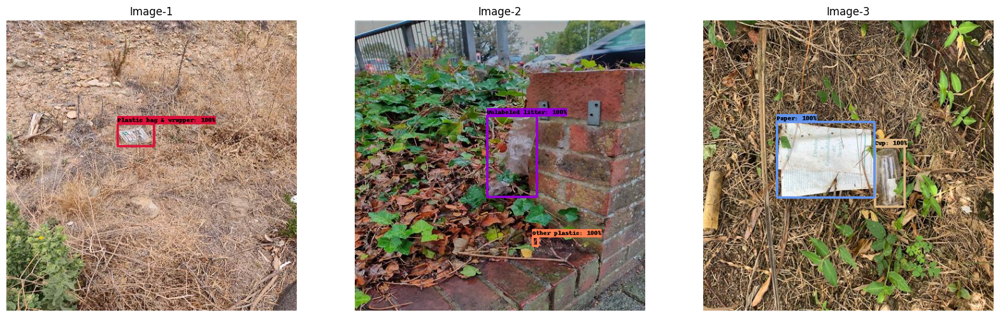

In [55]:
buffer_size = 20
num_of_examples = 3

raw_records = tf.data.TFRecordDataset(
    exp_config.task.train_data.input_path).shuffle(
        buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records, num_of_examples)


# Model training

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)


restoring or initializing model...
train | step:      0 | training until step 100...
train | step:    100 | steps/sec:    0.7 | output: 
    {'box_loss': 0.0875174,
     'cls_loss': 1.4619875,
     'learning_rate': 0.09755283,
     'model_loss': 5.837858,
     'total_loss': 13.253066,
     'training_loss': 13.253066}
saved checkpoint to ./trained_model/ckpt-100.
 eval | step:    100 | running 100 steps of evaluation...
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.54s).
Accumulating evaluation results...
DONE (t=0.58s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | ma

In [ ]:
%load_ext tensorboard
%tensorboard --logdir './trained_model/'


# Export model

In [ ]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)


# Test data visualization

In [ ]:
num_of_examples = 3

test_ds = tf.data.TFRecordDataset(
    './bccd_coco_tfrecords/test-00000-of-00001.tfrecord').take(
        num_of_examples)
show_batch(test_ds, num_of_examples)

# Import Model

In [ ]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

# Inference

In [ ]:
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.30 # Change minimum score for threshold to see all bounding boxes confidences.

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn(image)
  visualization_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      result['detection_boxes'][0].numpy(),
      result['detection_classes'][0].numpy().astype(int),
      result['detection_scores'][0].numpy(),
      category_index=category_index,
      use_normalized_coordinates=False,
      max_boxes_to_draw=200,
      min_score_thresh=min_score_thresh,
      agnostic_mode=False,
      instance_masks=None,
      line_thickness=4)
  plt.imshow(image_np)
  plt.axis('off')

plt.show()
